In [1]:
%pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=d19ec7b3241230e4eb705c42695a51aa779d753dab8ed35cc9f9cd04c01569ef
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
data = pd.read_csv('./parkinsons.csv')

Title: Parkinsons Disease Data Set

Data Set Characteristics: Multivariate
Number of Instances: 197
Area: Life
Attribute Characteristics: Real
Number of Attributes: 23
Date Donated: 2008-06-26
Associated Tasks: Classification
Missing Values? N/A

Attribute Information:

Matrix column entries (attributes):
name - ASCII subject name and recording number
MDVP:Fo(Hz) - Average vocal fundamental frequency
MDVP:Fhi(Hz) - Maximum vocal fundamental frequency
MDVP:Flo(Hz) - Minimum vocal fundamental frequency
MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP - Several
measures of variation in fundamental frequency
MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA - Several measures of variation in amplitude
NHR,HNR - Two measures of ratio of noise to tonal components in the voice status - Health status of the subject (one) - Parkinson's, (zero) - healthy RPDE,D2 - Two nonlinear dynamical complexity measures DFA - Signal fractal scaling exponent
spread1,spread2,PPE - Three nonlinear measures of fundamental frequency variation

In [4]:
data.head(10)

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,...,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
5,phon_R01_S01_6,120.552,131.162,113.787,0.00968,0.00008,0.00463,0.00750,0.01388,0.04701,...,0.06985,0.01222,21.378,1,0.415564,0.825069,-4.242867,0.299111,2.187560,0.357775
6,phon_R01_S02_1,120.267,137.244,114.820,0.00333,0.00003,0.00155,0.00202,0.00466,0.01608,...,0.02337,0.00607,24.886,1,0.596040,0.764112,-5.634322,0.257682,1.854785,0.211756
7,phon_R01_S02_2,107.332,113.840,104.315,0.00290,0.00003,0.00144,0.00182,0.00431,0.01567,...,0.02487,0.00344,26.892,1,0.637420,0.763262,-6.167603,0.183721,2.064693,0.163755
8,phon_R01_S02_3,95.730,132.068,91.754,0.00551,0.00006,0.00293,0.00332,0.00880,0.02093,...,0.03218,0.01070,21.812,1,0.615551,0.773587,-5.498678,0.327769,2.322511,0.231571
9,phon_R01_S02_4,95.056,120.103,91.226,0.00532,0.00006,0.00268,0.00332,0.00803,0.02838,...,0.04324,0.01022,21.862,1,0.547037,0.798463,-5.011879,0.325996,2.432792,0.271362


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   name              195 non-null    object 
 1   MDVP:Fo(Hz)       195 non-null    float64
 2   MDVP:Fhi(Hz)      195 non-null    float64
 3   MDVP:Flo(Hz)      195 non-null    float64
 4   MDVP:Jitter(%)    195 non-null    float64
 5   MDVP:Jitter(Abs)  195 non-null    float64
 6   MDVP:RAP          195 non-null    float64
 7   MDVP:PPQ          195 non-null    float64
 8   Jitter:DDP        195 non-null    float64
 9   MDVP:Shimmer      195 non-null    float64
 10  MDVP:Shimmer(dB)  195 non-null    float64
 11  Shimmer:APQ3      195 non-null    float64
 12  Shimmer:APQ5      195 non-null    float64
 13  MDVP:APQ          195 non-null    float64
 14  Shimmer:DDA       195 non-null    float64
 15  NHR               195 non-null    float64
 16  HNR               195 non-null    float64
 1

In [6]:
data.describe()

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
count,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,...,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000,195.000000
mean,154.228641,197.104918,116.324631,0.006220,0.000044,0.003306,0.003446,0.009920,0.029709,0.282251,...,0.046993,0.024847,21.885974,0.753846,0.498536,0.718099,-5.684397,0.226510,2.381826,0.206552
std,41.390065,91.491548,43.521413,0.004848,0.000035,0.002968,0.002759,0.008903,0.018857,0.194877,...,0.030459,0.040418,4.425764,0.431878,0.103942,0.055336,1.090208,0.083406,0.382799,0.090119
min,88.333000,102.145000,65.476000,0.001680,0.000007,0.000680,0.000920,0.002040,0.009540,0.085000,...,0.013640,0.000650,8.441000,0.000000,0.256570,0.574282,-7.964984,0.006274,1.423287,0.044539
25%,117.572000,134.862500,84.291000,0.003460,0.000020,0.001660,0.001860,0.004985,0.016505,0.148500,...,0.024735,0.005925,19.198000,1.000000,0.421306,0.674758,-6.450096,0.174351,2.099125,0.137451
50%,148.790000,175.829000,104.315000,0.004940,0.000030,0.002500,0.002690,0.007490,0.022970,0.221000,...,0.038360,0.011660,22.085000,1.000000,0.495954,0.722254,-5.720868,0.218885,2.361532,0.194052
75%,182.769000,224.205500,140.018500,0.007365,0.000060,0.003835,0.003955,0.011505,0.037885,0.350000,...,0.060795,0.025640,25.075500,1.000000,0.587562,0.761881,-5.046192,0.279234,2.636456,0.252980
max,260.105000,592.030000,239.170000,0.033160,0.000260,0.021440,0.019580,0.064330,0.119080,1.302000,...,0.169420,0.314820,33.047000,1.000000,0.685151,0.825288,-2.434031,0.450493,3.671155,0.527367


In [7]:
data.shape

(195, 24)

In [8]:
data.columns

Index(['name', 'MDVP:Fo(Hz)', 'MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)', 'MDVP:Jitter(%)',
       'MDVP:Jitter(Abs)', 'MDVP:RAP', 'MDVP:PPQ', 'Jitter:DDP',
       'MDVP:Shimmer', 'MDVP:Shimmer(dB)', 'Shimmer:APQ3', 'Shimmer:APQ5',
       'MDVP:APQ', 'Shimmer:DDA', 'NHR', 'HNR', 'status', 'RPDE', 'DFA',
       'spread1', 'spread2', 'D2', 'PPE'],
      dtype='object')

In [9]:
data.isnull().sum()

name                0
MDVP:Fo(Hz)         0
MDVP:Fhi(Hz)        0
MDVP:Flo(Hz)        0
MDVP:Jitter(%)      0
MDVP:Jitter(Abs)    0
MDVP:RAP            0
MDVP:PPQ            0
Jitter:DDP          0
MDVP:Shimmer        0
MDVP:Shimmer(dB)    0
Shimmer:APQ3        0
Shimmer:APQ5        0
MDVP:APQ            0
Shimmer:DDA         0
NHR                 0
HNR                 0
status              0
RPDE                0
DFA                 0
spread1             0
spread2             0
D2                  0
PPE                 0
dtype: int64

In [10]:
data[data.duplicated()]

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,...,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE


<ipython-input-12-aaed30872f1d>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(),annot=True,cmap=sns.cubehelix_palette(as_cmap=True))


<Axes: >

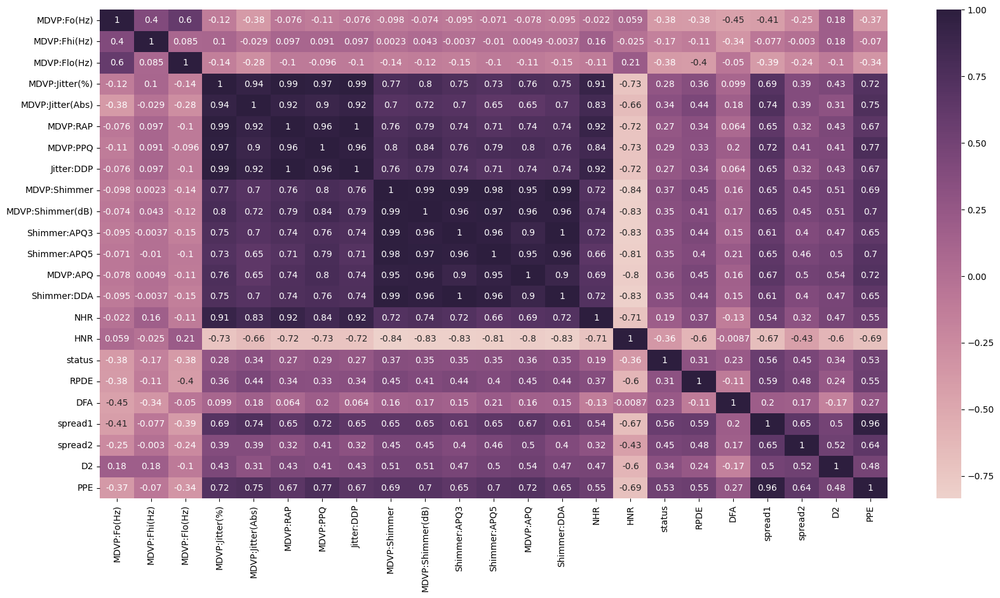

In [12]:
# different cmap values can be found here: https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html

plt.figure(figsize=(20,10))
sns.heatmap(data.corr(),annot=True,cmap=sns.cubehelix_palette(as_cmap=True))

In [11]:
data['status'].value_counts()

1    147
0     48
Name: status, dtype: int64

In [12]:
#Splitting the dataset into features and target
features = data.drop(columns=['name','status'])  #Exclude name which wil act as noise and status which is our target variable
target = data['status']

In [13]:
from sklearn.model_selection import train_test_split
feature_train, feature_test, target_train, target_test = train_test_split(features, target, random_state=200, test_size=0.2, stratify=target)

In [14]:
%pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 10.1 MB/s eta 0:00:00


In [15]:

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import ExtraTreesClassifier, BaggingClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from catboost import CatBoostClassifier

In [16]:

# Initialize models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('SVM', SVC(kernel='linear')),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Neural Network', MLPClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('Linear Discriminant Analysis', LinearDiscriminantAnalysis()),
    ('Gaussian Process', GaussianProcessClassifier()),
    ('Extra Trees', ExtraTreesClassifier()),
    ('Bagging', BaggingClassifier()),
    ('AdaBoost', AdaBoostClassifier()),
    ('CatBoost', CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='MultiClass'))
]

# Train and evaluate each model
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train, target_train, eval_set=(feature_test, target_test), verbose=False)
        accuracy = model.score(feature_test, target_test)
    else:
        model.fit(feature_train, target_train)
        accuracy = model.score(feature_test, target_test)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')


Logistic Regression Accuracy: 82.05 %
Decision Tree Accuracy: 89.74 %
Random Forest Accuracy: 89.74 %
SVM Accuracy: 84.62 %
K-Nearest Neighbors Accuracy: 82.05 %
Naive Bayes Accuracy: 69.23 %
Neural Network Accuracy: 79.49 %


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Gradient Boosting Accuracy: 94.87 %
Linear Discriminant Analysis Accuracy: 82.05 %
Gaussian Process Accuracy: 92.31 %
Extra Trees Accuracy: 92.31 %
Bagging Accuracy: 89.74 %
AdaBoost Accuracy: 82.05 %
CatBoost Accuracy: 89.74 %


In [17]:
import lime
import lime.lime_tabular
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier
from catboost import CatBoostClassifier

# Assuming feature_train and feature_test are your training and testing features, and target_train is your training target variable

# Models
random_forest = RandomForestClassifier()
gradient_boost = GradientBoostingClassifier()
extra_trees = ExtraTreesClassifier()
cat_boost = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='MultiClass')

models = [
    ('Random Forest', random_forest),
    ('Gradient Boost', gradient_boost),
    ('Extra Trees', extra_trees),
    ('CatBoost', cat_boost)
]

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(feature_train.values,
                                                   mode='classification',
                                                   feature_names=feature_train.columns,
                                                   class_names=target_train.unique(),
                                                   discretize_continuous=True)

# Train and evaluate each model with LIME explanation
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train, target_train, eval_set=(feature_test, target_test), verbose=False)
    else:
        model.fit(feature_train, target_train)

    explanation = explainer.explain_instance(feature_test.iloc[0].values, model.predict_proba, num_features=len(feature_train.columns))

    print(f"\n{name} Explanation:")
    explanation.show_in_notebook()



Random Forest Explanation:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(



Gradient Boost Explanation:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(



Extra Trees Explanation:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names
  warnings.warn(



CatBoost Explanation:


In [21]:
# test the svm model with different kernels

kernels = ['linear', 'poly', 'rbf', 'sigmoid']

for kernel in kernels:
    svm_model = SVC(kernel=kernel)
    svm_model.fit(feature_train, target_train)
    accuracy = svm_model.score(feature_test, target_test)
    print(f'{kernel} Accuracy: {accuracy * 100}%')

linear Accuracy: 84.61538461538461%
poly Accuracy: 79.48717948717949%
rbf Accuracy: 79.48717948717949%
sigmoid Accuracy: 74.35897435897436%


In [22]:
# test the logistic regression model with different solvers

solvers = ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']

for solver in solvers:
    lr_model = LogisticRegression(solver=solver)
    lr_model.fit(feature_train, target_train)
    accuracy = lr_model.score(feature_test, target_test)
    print(f'{solver} Accuracy: {accuracy * 100}%')



newton-cg Accuracy: 82.05128205128204%
lbfgs Accuracy: 79.48717948717949%
liblinear Accuracy: 82.05128205128204%


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


sag Accuracy: 74.35897435897436%
saga Accuracy: 74.35897435897436%


In [18]:
names = []
scores = []

for name, model in models:
    model.fit(feature_train, target_train)
    accuracy = model.score(feature_test, target_test)
    names.append(name)
    scores.append(accuracy*100)

0:	learn: 0.6581920	total: 4.86ms	remaining: 482ms
1:	learn: 0.6201921	total: 9.72ms	remaining: 476ms
2:	learn: 0.5869058	total: 13.9ms	remaining: 448ms
3:	learn: 0.5609211	total: 21.3ms	remaining: 511ms
4:	learn: 0.5250635	total: 25.7ms	remaining: 489ms
5:	learn: 0.4955241	total: 30ms	remaining: 470ms
6:	learn: 0.4768124	total: 34.8ms	remaining: 463ms
7:	learn: 0.4570553	total: 39.5ms	remaining: 454ms
8:	learn: 0.4366481	total: 44.3ms	remaining: 447ms
9:	learn: 0.4199629	total: 48.7ms	remaining: 438ms
10:	learn: 0.3973527	total: 54.7ms	remaining: 442ms
11:	learn: 0.3824506	total: 61.7ms	remaining: 453ms
12:	learn: 0.3658314	total: 66ms	remaining: 441ms
13:	learn: 0.3563028	total: 70.4ms	remaining: 433ms
14:	learn: 0.3431287	total: 75.1ms	remaining: 426ms
15:	learn: 0.3330321	total: 80.1ms	remaining: 421ms
16:	learn: 0.3221594	total: 84.7ms	remaining: 414ms
17:	learn: 0.3098102	total: 89.4ms	remaining: 407ms
18:	learn: 0.3005680	total: 93.9ms	remaining: 400ms
19:	learn: 0.2904146	total

In [25]:
# export accuracy scores to csv file
accuracy_df = pd.DataFrame({'Model': names, 'Accuracy': scores})
accuracy_df.to_csv('./accuracy_scores_test_before_smote_pca.csv', index=False)


In [19]:
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train, target_train, eval_set=(feature_train, target_train), verbose=False)
        accuracy = model.score(feature_train, target_train)
    else:
        model.fit(feature_train, target_train)
        accuracy = model.score(feature_train, target_train)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')

Random Forest Accuracy: 100.00 %
Gradient Boost Accuracy: 100.00 %
Extra Trees Accuracy: 100.00 %
CatBoost Accuracy: 100.00 %


In [27]:
names = []
scores = []

for name, model in models:
    model.fit(feature_train, target_train)
    accuracy = model.score(feature_train, target_train)
    names.append(name)
    scores.append(accuracy*100)

0:	learn: 0.6581920	total: 26.5ms	remaining: 2.63s
1:	learn: 0.6201921	total: 55.2ms	remaining: 2.71s
2:	learn: 0.5869058	total: 84ms	remaining: 2.72s
3:	learn: 0.5609211	total: 125ms	remaining: 3s
4:	learn: 0.5250635	total: 142ms	remaining: 2.71s
5:	learn: 0.4955241	total: 164ms	remaining: 2.57s
6:	learn: 0.4768124	total: 187ms	remaining: 2.48s
7:	learn: 0.4570553	total: 204ms	remaining: 2.34s
8:	learn: 0.4366481	total: 243ms	remaining: 2.46s
9:	learn: 0.4199629	total: 285ms	remaining: 2.56s
10:	learn: 0.3973527	total: 308ms	remaining: 2.49s
11:	learn: 0.3824506	total: 335ms	remaining: 2.46s
12:	learn: 0.3658314	total: 356ms	remaining: 2.38s
13:	learn: 0.3563028	total: 393ms	remaining: 2.42s
14:	learn: 0.3431287	total: 420ms	remaining: 2.38s
15:	learn: 0.3330321	total: 455ms	remaining: 2.39s
16:	learn: 0.3221594	total: 483ms	remaining: 2.36s
17:	learn: 0.3098102	total: 504ms	remaining: 2.3s
18:	learn: 0.3005680	total: 526ms	remaining: 2.24s
19:	learn: 0.2904146	total: 576ms	remaining:

In [28]:
# export accuracy scores to csv file
accuracy_df = pd.DataFrame({'Model': names, 'Accuracy': scores})
accuracy_df.to_csv('./accuracy_scores_train_before_smote_pca.csv', index=False)


SMOTE

In [20]:
from imblearn.over_sampling import SMOTE

In [21]:
smote = SMOTE(random_state=42)
features_smote, target_smote = smote.fit_resample(features, target)

In [31]:
print("Target before smote \n",target.value_counts())

print("Target after smote\n", target_smote.value_counts())

Target before smote 
 1    147
0     48
Name: status, dtype: int64
Target after smote
 1    147
0    147
Name: status, dtype: int64


In [32]:
# train-test split
from sklearn.model_selection import train_test_split
feature_train_smote, feature_test_smote, target_train_smote, target_test_smote = train_test_split(features_smote, target_smote, random_state=200, test_size=0.2, stratify=target_smote)


on test set

In [33]:

# Initialize models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('SVM', SVC(kernel='linear')),
    ('K-Nearest Neighbors', KNeighborsClassifier()),
    ('Naive Bayes', GaussianNB()),
    ('Neural Network', MLPClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('Linear Discriminant Analysis', LinearDiscriminantAnalysis()),
    ('Gaussian Process', GaussianProcessClassifier()),
    ('Extra Trees', ExtraTreesClassifier()),
    ('Bagging', BaggingClassifier()),
    ('AdaBoost', AdaBoostClassifier()),
    ('CatBoost', CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='MultiClass'))
]

# Train and evaluate each model
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train_smote, target_train_smote, eval_set=(feature_test_smote, target_test_smote), verbose=False)
        accuracy = model.score(feature_test_smote, target_test_smote)
    else:
        model.fit(feature_train_smote, target_train_smote)
        accuracy = model.score(feature_test_smote, target_test_smote)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')


Logistic Regression Accuracy: 77.97 %
Decision Tree Accuracy: 91.53 %
Random Forest Accuracy: 96.61 %
SVM Accuracy: 81.36 %
K-Nearest Neighbors Accuracy: 86.44 %
Naive Bayes Accuracy: 76.27 %


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Neural Network Accuracy: 79.66 %
Gradient Boosting Accuracy: 96.61 %
Linear Discriminant Analysis Accuracy: 86.44 %
Gaussian Process Accuracy: 88.14 %
Extra Trees Accuracy: 96.61 %
Bagging Accuracy: 91.53 %
AdaBoost Accuracy: 89.83 %
CatBoost Accuracy: 94.92 %


In [34]:
names = []
scores = []

for name, model in models:
    model.fit(feature_train_smote, target_train_smote)
    accuracy = model.score(feature_test_smote, target_test_smote)
    names.append(name)
    scores.append(accuracy*100)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0:	learn: 0.6460269	total: 55.7ms	remaining: 5.51s
1:	learn: 0.6160575	total: 96.5ms	remaining: 4.73s
2:	learn: 0.5849140	total: 133ms	remaining: 4.29s
3:	learn: 0.5472098	total: 196ms	remaining: 4.7s
4:	learn: 0.5169113	total: 230ms	remaining: 4.36s
5:	learn: 0.4913494	total: 277ms	remaining: 4.34s
6:	learn: 0.4703036	total: 311ms	remaining: 4.13s
7:	learn: 0.4437245	total: 344ms	remaining: 3.96s
8:	learn: 0.4216399	total: 375ms	remaining: 3.79s
9:	learn: 0.4053761	total: 399ms	remaining: 3.59s
10:	learn: 0.3852267	total: 439ms	remaining: 3.55s
11:	learn: 0.3729683	total: 468ms	remaining: 3.43s
12:	learn: 0.3571426	total: 523ms	remaining: 3.5s
13:	learn: 0.3438972	total: 569ms	remaining: 3.5s
14:	learn: 0.3303178	total: 631ms	remaining: 3.58s
15:	learn: 0.3185293	total: 698ms	remaining: 3.66s
16:	learn: 0.3065622	total: 735ms	remaining: 3.59s
17:	learn: 0.2941199	total: 799ms	remaining: 3.64s
18:	learn: 0.2842758	total: 834ms	remaining: 3.56s
19:	learn: 0.2746037	total: 890ms	remainin

In [35]:
# export accuracy scores to csv file
accuracy_df = pd.DataFrame({'Model': names, 'Accuracy': scores})
accuracy_df.to_csv('./accuracy_scores_test_after_smote.csv', index=False)


on train set

In [37]:
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train_smote, target_train_smote, eval_set=(feature_train_smote, target_train_smote), verbose=False)
        accuracy = model.score(feature_train_smote, target_train_smote)
    else:
        model.fit(feature_train_smote, target_train_smote)
        accuracy = model.score(feature_train_smote, target_train_smote)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')

Logistic Regression Accuracy: 81.28 %
Decision Tree Accuracy: 100.00 %
Random Forest Accuracy: 100.00 %
SVM Accuracy: 83.83 %
K-Nearest Neighbors Accuracy: 91.06 %
Naive Bayes Accuracy: 80.43 %
Neural Network Accuracy: 81.70 %
Gradient Boosting Accuracy: 100.00 %
Linear Discriminant Analysis Accuracy: 88.51 %
Gaussian Process Accuracy: 100.00 %
Extra Trees Accuracy: 100.00 %
Bagging Accuracy: 99.57 %
AdaBoost Accuracy: 100.00 %
CatBoost Accuracy: 100.00 %


In [38]:
names = []
scores = []

for name, model in models:
    model.fit(feature_train_smote, target_train_smote)
    accuracy = model.score(feature_train_smote, target_train_smote)
    names.append(name)
    scores.append(accuracy*100)

0:	learn: 0.6460269	total: 15.7ms	remaining: 1.55s
1:	learn: 0.6160575	total: 31.3ms	remaining: 1.53s
2:	learn: 0.5849140	total: 48.5ms	remaining: 1.57s
3:	learn: 0.5472098	total: 67.3ms	remaining: 1.61s
4:	learn: 0.5169113	total: 87.4ms	remaining: 1.66s
5:	learn: 0.4913494	total: 104ms	remaining: 1.63s
6:	learn: 0.4703036	total: 122ms	remaining: 1.62s
7:	learn: 0.4437245	total: 138ms	remaining: 1.58s
8:	learn: 0.4216399	total: 154ms	remaining: 1.56s
9:	learn: 0.4053761	total: 172ms	remaining: 1.55s
10:	learn: 0.3852267	total: 195ms	remaining: 1.58s
11:	learn: 0.3729683	total: 219ms	remaining: 1.6s
12:	learn: 0.3571426	total: 237ms	remaining: 1.58s
13:	learn: 0.3438972	total: 254ms	remaining: 1.56s
14:	learn: 0.3303178	total: 270ms	remaining: 1.53s
15:	learn: 0.3185293	total: 287ms	remaining: 1.51s
16:	learn: 0.3065622	total: 305ms	remaining: 1.49s
17:	learn: 0.2941199	total: 321ms	remaining: 1.46s
18:	learn: 0.2842758	total: 338ms	remaining: 1.44s
19:	learn: 0.2746037	total: 355ms	rem

In [39]:
# export accuracy scores to csv file
accuracy_df = pd.DataFrame({'Model': names, 'Accuracy': scores})
accuracy_df.to_csv('./accuracy_scores_train_after_smote.csv', index=False)


PCA

In [40]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import numpy as np


# Standardize the data
scaler = StandardScaler()
data_std = scaler.fit_transform(data.drop(columns=['name']))

# Apply PCA
pca = PCA()
pca.fit(data_std)



PCA()

In [41]:
# Get explained variance ratios
explained_variance_ratios = pca.explained_variance_ratio_

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(explained_variance_ratios)

# Find the number of components for 99% variance
n_components_for_99_variance = np.argmax(cumulative_variance >= 0.99) + 1  # Add 1 to account for 0-based indexing

print(f"Number of components to explain 99% variance: {n_components_for_99_variance}")

Number of components to explain 99% variance: 13


In [42]:
# Apply PCA with 13 components
pca = PCA(n_components=13)
data_transformed = pca.fit_transform(data_std)

In [43]:
# After fitting the PCA model
pca_components = pca.components_

# Assuming you have 13 components
for i in range(13):
    print(f"Component {i + 1}:")
    component_info = [(features.columns[j], pca_components[i][j]) for j in range(len(features.columns))]
    component_info.sort(key=lambda x: abs(x[1]), reverse=True)
    print(component_info)


Component 1:
[('MDVP:Shimmer(dB)', 0.2592597487274423), ('MDVP:Shimmer', 0.2577196650507076), ('MDVP:PPQ', 0.2535059027628288), ('MDVP:APQ', 0.2514893457888571), ('MDVP:Jitter(%)', 0.25140845897374503), ('Shimmer:DDA', 0.25103372400392965), ('Shimmer:APQ3', 0.2510324037705507), ('Shimmer:APQ5', 0.25012523006532644), ('MDVP:RAP', 0.2466571048578787), ('Jitter:DDP', 0.24665230297672328), ('HNR', -0.24015590900049813), ('MDVP:Jitter(Abs)', 0.23961617509015615), ('NHR', 0.23030442724578026), ('spread2', 0.22450945395553962), ('PPE', 0.15472499118685665), ('D2', 0.1521295017753304), ('DFA', 0.1467781255838831), ('RPDE', 0.12340175725031742), ('MDVP:Flo(Hz)', -0.066564381722762), ('MDVP:Fo(Hz)', -0.05646534653234569), ('spread1', 0.04267352279831351), ('MDVP:Fhi(Hz)', 0.004587214447683504)]
Component 2:
[('MDVP:Fo(Hz)', 0.5095885479255962), ('MDVP:Flo(Hz)', 0.379258847073585), ('MDVP:Fhi(Hz)', 0.31878924263906955), ('RPDE', -0.3158535863094988), ('spread1', -0.2821982534477758), ('spread2', 

In [45]:
data_transformed.shape

(195, 13)

In [46]:
# Separating features and target variable
features = data.drop(columns=['name', 'status'], axis=1)
target = data['status']

# Standardize the features
scaler = StandardScaler()
features_std = scaler.fit_transform(features)

# Apply PCA
pca = PCA(n_components=13)  # Number of components based on previous calculation
features_transformed = pca.fit_transform(features_std)

In [47]:

feature_train_pca, feature_test_pca, target_train_pca, target_test_pca = train_test_split(features_transformed, target, random_state=200, test_size=0.2, stratify=target)

In [48]:

# Initialize models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('SVM', SVC(kernel='linear')),
    ('K-Nearest Neighbors', KNeighborsClassifier(n_neighbors=3)),
    ('Naive Bayes', GaussianNB()),
    ('Neural Network', MLPClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('Linear Discriminant Analysis', LinearDiscriminantAnalysis()),
    ('Gaussian Process', GaussianProcessClassifier()),
    ('Extra Trees', ExtraTreesClassifier()),
    ('Bagging', BaggingClassifier()),
    ('AdaBoost', AdaBoostClassifier()),
    ('CatBoost', CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='MultiClass'))
]

# Train and evaluate each model
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train_pca, target_train_pca, eval_set=(feature_test_pca, target_test_pca), verbose=False)
        accuracy = model.score(feature_test_pca, target_test_pca)
    else:
        model.fit(feature_train_pca, target_train_pca)
        accuracy = model.score(feature_test_pca, target_test_pca)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')


Logistic Regression Accuracy: 82.05 %
Decision Tree Accuracy: 79.49 %
Random Forest Accuracy: 82.05 %
SVM Accuracy: 84.62 %
K-Nearest Neighbors Accuracy: 87.18 %
Naive Bayes Accuracy: 74.36 %


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Neural Network Accuracy: 87.18 %
Gradient Boosting Accuracy: 82.05 %
Linear Discriminant Analysis Accuracy: 82.05 %
Gaussian Process Accuracy: 84.62 %
Extra Trees Accuracy: 84.62 %
Bagging Accuracy: 87.18 %
AdaBoost Accuracy: 84.62 %
CatBoost Accuracy: 79.49 %


In [49]:
names = []
scores = []

for name, model in models:
    model.fit(feature_train_pca, target_train_pca)
    accuracy = model.score(feature_test_pca, target_test_pca)
    names.append(name)
    scores.append(accuracy*100)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0:	learn: 0.6622829	total: 6.92ms	remaining: 685ms
1:	learn: 0.6311251	total: 13.1ms	remaining: 644ms
2:	learn: 0.5966185	total: 20.8ms	remaining: 672ms
3:	learn: 0.5695312	total: 27.7ms	remaining: 665ms
4:	learn: 0.5487081	total: 33.9ms	remaining: 644ms
5:	learn: 0.5285851	total: 43ms	remaining: 674ms
6:	learn: 0.5092936	total: 46.7ms	remaining: 621ms
7:	learn: 0.4920449	total: 53.5ms	remaining: 615ms
8:	learn: 0.4761778	total: 58.2ms	remaining: 588ms
9:	learn: 0.4573874	total: 65ms	remaining: 585ms
10:	learn: 0.4463835	total: 74.3ms	remaining: 601ms
11:	learn: 0.4293077	total: 80.5ms	remaining: 590ms
12:	learn: 0.4130337	total: 87.7ms	remaining: 587ms
13:	learn: 0.3984340	total: 95.4ms	remaining: 586ms
14:	learn: 0.3855728	total: 101ms	remaining: 575ms
15:	learn: 0.3763556	total: 107ms	remaining: 561ms
16:	learn: 0.3637838	total: 111ms	remaining: 543ms
17:	learn: 0.3548433	total: 119ms	remaining: 542ms
18:	learn: 0.3457993	total: 125ms	remaining: 532ms
19:	learn: 0.3379356	total: 132

In [50]:
# export accuracy scores to csv file
accuracy_df = pd.DataFrame({'Model': names, 'Accuracy': scores})
accuracy_df.to_csv('./accuracy_scores_test_after_pca.csv', index=False)


In [51]:
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train_pca, target_train_pca, eval_set=(feature_train_pca, target_train_pca), verbose=False)
        accuracy = model.score(feature_train_pca, target_train_pca)
    else:
        model.fit(feature_train_pca, target_train_pca)
        accuracy = model.score(feature_train_pca, target_train_pca)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')

Logistic Regression Accuracy: 87.18 %
Decision Tree Accuracy: 100.00 %
Random Forest Accuracy: 100.00 %
SVM Accuracy: 89.74 %
K-Nearest Neighbors Accuracy: 99.36 %
Naive Bayes Accuracy: 85.90 %


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Neural Network Accuracy: 94.23 %
Gradient Boosting Accuracy: 100.00 %
Linear Discriminant Analysis Accuracy: 86.54 %
Gaussian Process Accuracy: 100.00 %
Extra Trees Accuracy: 100.00 %
Bagging Accuracy: 97.44 %
AdaBoost Accuracy: 100.00 %
CatBoost Accuracy: 100.00 %


In [52]:
names = []
scores = []

for name, model in models:
    model.fit(feature_train_pca, target_train_pca)
    accuracy = model.score(feature_train_pca, target_train_pca)
    names.append(name)
    scores.append(accuracy*100)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


0:	learn: 0.6622829	total: 3.78ms	remaining: 374ms
1:	learn: 0.6311251	total: 7.93ms	remaining: 389ms
2:	learn: 0.5966185	total: 11.8ms	remaining: 380ms
3:	learn: 0.5695312	total: 15.5ms	remaining: 373ms
4:	learn: 0.5487081	total: 23.8ms	remaining: 452ms
5:	learn: 0.5285851	total: 29.2ms	remaining: 458ms
6:	learn: 0.5092936	total: 33.9ms	remaining: 451ms
7:	learn: 0.4920449	total: 40.8ms	remaining: 469ms
8:	learn: 0.4761778	total: 44.6ms	remaining: 451ms
9:	learn: 0.4573874	total: 49.7ms	remaining: 447ms
10:	learn: 0.4463835	total: 55.8ms	remaining: 451ms
11:	learn: 0.4293077	total: 59.1ms	remaining: 433ms
12:	learn: 0.4130337	total: 62.7ms	remaining: 420ms
13:	learn: 0.3984340	total: 69.5ms	remaining: 427ms
14:	learn: 0.3855728	total: 74.2ms	remaining: 420ms
15:	learn: 0.3763556	total: 77.5ms	remaining: 407ms
16:	learn: 0.3637838	total: 83.7ms	remaining: 409ms
17:	learn: 0.3548433	total: 91.8ms	remaining: 418ms
18:	learn: 0.3457993	total: 96.3ms	remaining: 411ms
19:	learn: 0.3379356	t

In [53]:
# export accuracy scores to csv file
accuracy_df = pd.DataFrame({'Model': names, 'Accuracy': scores})
accuracy_df.to_csv('./accuracy_scores_train_after_pca.csv', index=False)


PCA with SMOTE

In [54]:
smote = SMOTE(random_state=42)
features_smote_pca, target_smote_pca = smote.fit_resample(features_transformed, target)

In [55]:

feature_train_smote_pca, feature_test_smote_pca, target_train_smote_pca, target_test_smote_pca = train_test_split(features_smote_pca, target_smote_pca, random_state=200, test_size=0.2, stratify=target_smote_pca)

In [56]:

# Initialize models
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear')),
    ('Decision Tree', DecisionTreeClassifier()),
    ('Random Forest', RandomForestClassifier()),
    ('SVM', SVC(kernel='linear')),
    ('K-Nearest Neighbors', KNeighborsClassifier(n_neighbors=3)),
    ('Naive Bayes', GaussianNB()),
    ('Neural Network', MLPClassifier()),
    ('Gradient Boosting', GradientBoostingClassifier()),
    ('Linear Discriminant Analysis', LinearDiscriminantAnalysis()),
    ('Gaussian Process', GaussianProcessClassifier()),
    ('Extra Trees', ExtraTreesClassifier()),
    ('Bagging', BaggingClassifier()),
    ('AdaBoost', AdaBoostClassifier()),
    ('CatBoost', CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='MultiClass'))
]

# Train and evaluate each model
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train_smote_pca, target_train_smote_pca, eval_set=(feature_test_smote_pca, target_test_smote_pca), verbose=False)
        accuracy = model.score(feature_test_smote_pca, target_test_smote_pca)
    else:
        model.fit(feature_train_smote_pca, target_train_smote_pca)
        accuracy = model.score(feature_test_smote_pca, target_test_smote_pca)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')


Logistic Regression Accuracy: 81.36 %
Decision Tree Accuracy: 96.61 %
Random Forest Accuracy: 96.61 %
SVM Accuracy: 83.05 %
K-Nearest Neighbors Accuracy: 94.92 %
Naive Bayes Accuracy: 84.75 %


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Neural Network Accuracy: 94.92 %
Gradient Boosting Accuracy: 94.92 %
Linear Discriminant Analysis Accuracy: 77.97 %
Gaussian Process Accuracy: 96.61 %
Extra Trees Accuracy: 96.61 %
Bagging Accuracy: 89.83 %
AdaBoost Accuracy: 88.14 %
CatBoost Accuracy: 96.61 %


In [57]:
import lime
import lime.lime_tabular

In [59]:

# Convert NumPy arrays to pandas DataFrame
feature_train_smote_pca_df = pd.DataFrame(feature_train_smote_pca)  # Assuming 'feature_train_smote_pca' is your NumPy array

feature_test_smote_pca_df = pd.DataFrame(feature_test_smote_pca)  # Assuming 'feature_test_smote_pca' is your NumPy array


feature_test_smote_pca_df.columns = feature_test_smote_pca_df.columns.astype(str)
feature_train_smote_pca_df.columns = feature_train_smote_pca_df.columns.astype(str)


# Models
random_forest = RandomForestClassifier()
gradient_boost = GradientBoostingClassifier()
extra_trees = ExtraTreesClassifier()
cat_boost = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, loss_function='MultiClass')

models = [
    ('Random Forest', random_forest),
    ('Gradient Boost', gradient_boost),
    ('Extra Trees', extra_trees),
    ('CatBoost', cat_boost)
]

# Initialize LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(feature_train_smote_pca_df.values,
                                                   mode='classification',
                                                   feature_names=feature_train_smote_pca_df.columns,
                                                   class_names=target_train_smote_pca.unique(),
                                                   discretize_continuous=True)

# Train and evaluate each model with LIME explanation
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train_smote_pca_df, target_train_smote_pca, eval_set=(feature_test_smote_pca_df, target_test_smote_pca), verbose=False)
    else:
        model.fit(feature_train_smote_pca_df, target_train_smote_pca)

    explanation = explainer.explain_instance(feature_test_smote_pca_df.iloc[0].values, model.predict_proba, num_features=len(feature_train_smote_pca_df.columns))

    print(f"\n{name} Explanation:")
    explanation.show_in_notebook()
    # explanation.save_graph(f'{name}_lime_explanation.png')


Random Forest Explanation:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(



Gradient Boost Explanation:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GradientBoostingClassifier was fitted with feature names
  warnings.warn(



Extra Trees Explanation:


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but ExtraTreesClassifier was fitted with feature names
  warnings.warn(



CatBoost Explanation:


In [63]:
names = []
scores = []

for name, model in models:
    model.fit(feature_train_smote_pca, target_train_smote_pca)
    accuracy = model.score(feature_test_smote_pca, target_test_smote_pca)
    names.append(name)
    scores.append(accuracy*100)

0:	learn: 0.6480992	total: 5.44ms	remaining: 538ms
1:	learn: 0.6122895	total: 11.1ms	remaining: 544ms
2:	learn: 0.5817022	total: 16.4ms	remaining: 531ms
3:	learn: 0.5551734	total: 22ms	remaining: 528ms
4:	learn: 0.5249995	total: 27.4ms	remaining: 521ms
5:	learn: 0.5022535	total: 32.9ms	remaining: 515ms
6:	learn: 0.4799055	total: 38.4ms	remaining: 510ms
7:	learn: 0.4543544	total: 44ms	remaining: 506ms
8:	learn: 0.4323866	total: 49.6ms	remaining: 501ms
9:	learn: 0.4161298	total: 54.9ms	remaining: 494ms
10:	learn: 0.3985114	total: 61.9ms	remaining: 501ms
11:	learn: 0.3799473	total: 67.8ms	remaining: 497ms
12:	learn: 0.3664295	total: 73.3ms	remaining: 491ms
13:	learn: 0.3509606	total: 78.6ms	remaining: 483ms
14:	learn: 0.3443136	total: 84.2ms	remaining: 477ms
15:	learn: 0.3311206	total: 89.5ms	remaining: 470ms
16:	learn: 0.3198988	total: 94.9ms	remaining: 463ms
17:	learn: 0.3122272	total: 100ms	remaining: 458ms
18:	learn: 0.3030862	total: 106ms	remaining: 451ms
19:	learn: 0.2953860	total: 

In [ ]:
# export accuracy scores to csv file
accuracy_df = pd.DataFrame({'Model': names, 'Accuracy': scores})
accuracy_df.to_csv('./accuracy_scores_test_after_smote_pca.csv', index=False)


In [62]:
for name, model in models:
    if name == 'CatBoost':
        model.fit(feature_train_smote_pca, target_train_smote_pca, eval_set=(feature_train_smote_pca, target_train_smote_pca), verbose=False)
        accuracy = model.score(feature_train_smote_pca, target_train_smote_pca)
    else:
        model.fit(feature_train_smote_pca, target_train_smote_pca)
        accuracy = model.score(feature_train_smote_pca, target_train_smote_pca)
    print(f'{name} Accuracy: {accuracy * 100:.2f} %')

Random Forest Accuracy: 100.00 %
Gradient Boost Accuracy: 100.00 %
Extra Trees Accuracy: 100.00 %
CatBoost Accuracy: 100.00 %


In [61]:
names = []
scores = []


for name, model in models:
    model.fit(feature_train_smote_pca, target_train_smote_pca)
    accuracy = model.score(feature_train_smote_pca, target_train_smote_pca)
    names.append(name)
    scores.append(accuracy*100)

0:	learn: 0.6480992	total: 5.47ms	remaining: 542ms
1:	learn: 0.6122895	total: 11ms	remaining: 541ms
2:	learn: 0.5817022	total: 16.3ms	remaining: 527ms
3:	learn: 0.5551734	total: 21.5ms	remaining: 517ms
4:	learn: 0.5249995	total: 26.6ms	remaining: 506ms
5:	learn: 0.5022535	total: 31.7ms	remaining: 497ms
6:	learn: 0.4799055	total: 37.4ms	remaining: 497ms
7:	learn: 0.4543544	total: 42.8ms	remaining: 492ms
8:	learn: 0.4323866	total: 48.3ms	remaining: 488ms
9:	learn: 0.4161298	total: 53.4ms	remaining: 481ms
10:	learn: 0.3985114	total: 58.8ms	remaining: 476ms
11:	learn: 0.3799473	total: 64ms	remaining: 469ms
12:	learn: 0.3664295	total: 69.4ms	remaining: 465ms
13:	learn: 0.3509606	total: 74.7ms	remaining: 459ms
14:	learn: 0.3443136	total: 80.2ms	remaining: 454ms
15:	learn: 0.3311206	total: 85.5ms	remaining: 449ms
16:	learn: 0.3198988	total: 90.8ms	remaining: 443ms
17:	learn: 0.3122272	total: 96.2ms	remaining: 438ms
18:	learn: 0.3030862	total: 101ms	remaining: 433ms
19:	learn: 0.2953860	total:

In [ ]:
# export accuracy scores to csv file
accuracy_df = pd.DataFrame({'Model': names, 'Accuracy': scores})
accuracy_df.to_csv('./accuracy_scores_train_after_smote_pca.csv', index=False)
